# Telecom Churn

### Customer churn prediction: Telecom Churn Dataset

Customer churn, also known as customer retention, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

Companies usually make a distinction between voluntary churn and involuntary churn. Voluntary churn occurs due to a decision by the customer to switch to another company or service provider, involuntary churn occurs due to circumstances such as a customer's relocation to a long-term care facility, death, or the relocation to a distant location. In most applications, involuntary reasons for churn are excluded from the analytical models. Analysts tend to concentrate on voluntary churn, because it typically occurs due to factors of the company-customer relationship which companies control, such as how billing interactions are handled or how after-sales help is provided.

predictive analytics use churn prediction models that predict customer churn by assessing their propensity of risk to churn. Since these models generate a small prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

#### About Telecom Churn Dataset

Each row represents a customer; each column contains customer’s attributes.
The datasets have the following attributes or features:

- State: string
- Account length: integer
- Area code: integer
- International plan: string
- Voice mail plan: string
- Number vmail messages: integer
- Total day minutes: double
- Total day calls: integer
- Total day charge: double
- Total eve minutes: double
- Total eve calls: integer
- Total eve charge: double
- Total night minutes: double
- Total night calls: integer
- Total night charge: double
- Total intl minutes: double
- Total intl calls: integer
- Total intl charge: double
- Customer service calls: integer
- Churn: string
- The "churn-bigml-80" dataset contains 2666 rows (customers) and 20 columns (features).
- The "Churn" column is the target to predict.


## Loading and Preparing Data

In [1]:
import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report

from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MaxAbsScaler

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix,classification_report
from xgboost import XGBClassifier
from sklearn.model_selection import KFold,cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

import xgboost as xgb
from sklearn.metrics import mean_squared_error

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [39]:
#!pip install pandas-profiling

### Collect data
#### First df_train ='churn-bigml-80.csv'

In [2]:
df_train = pd.read_csv('churn-bigml-80.csv')

In [27]:
df_train

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,415,No,No,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,False
2662,AZ,192,415,No,Yes,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
2663,WV,68,415,No,No,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
2664,RI,28,510,No,No,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False


In [3]:
df_test = pd.read_csv('churn-bigml-20.csv')

In [103]:
df_test

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,125,13.23,247.6,94,11.14,11.5,7,3.11,2,False
663,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,131,17.33,229.5,73,10.33,8.1,3,2.19,1,False
664,VT,60,415,No,No,0,193.9,118,32.96,85.0,110,7.23,210.1,134,9.45,13.2,8,3.56,3,False
665,WV,159,415,No,No,0,169.8,114,28.87,197.7,105,16.80,193.7,82,8.72,11.6,4,3.13,1,False


### EDA

In [30]:
#df_train.info()

In [28]:
df_train.shape

(2666, 20)

In [4]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df_train, title="Pandas Profiling Report", explorative=True)

profile.to_notebook_iframe()

C:\Users\alhai\AppData\Local\Temp\ipykernel_5576\1557572679.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


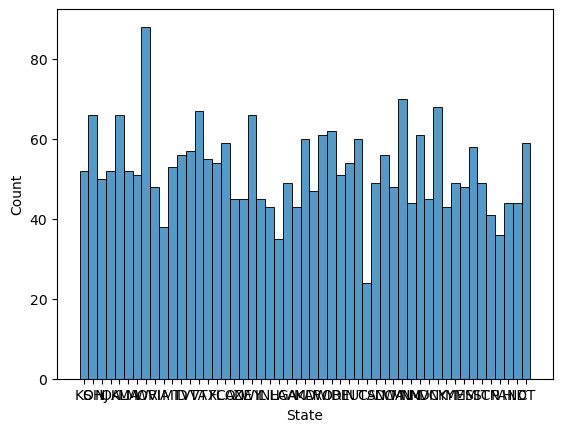

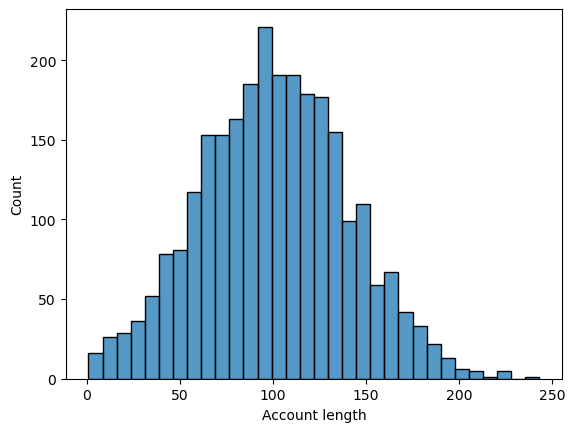

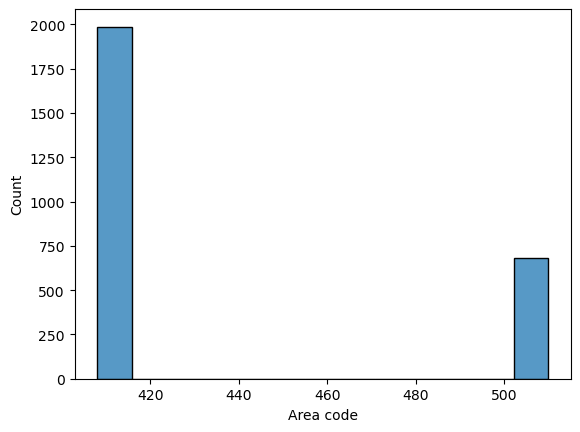

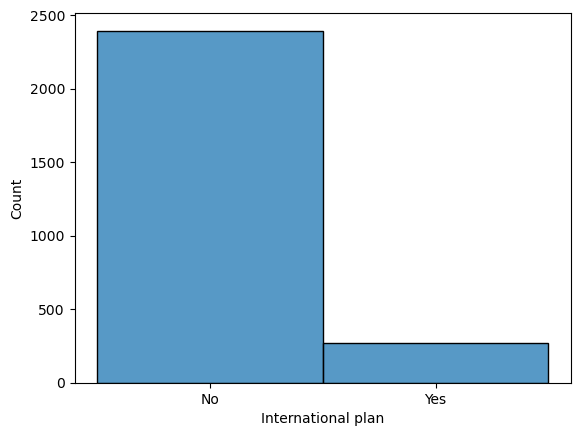

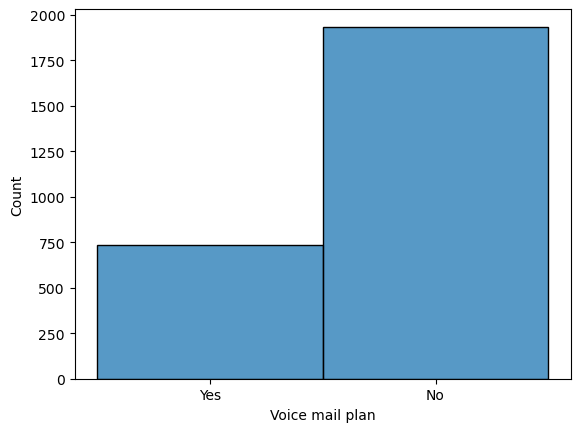

...

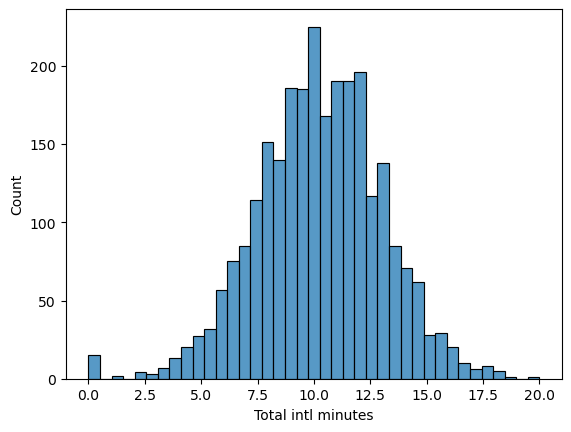

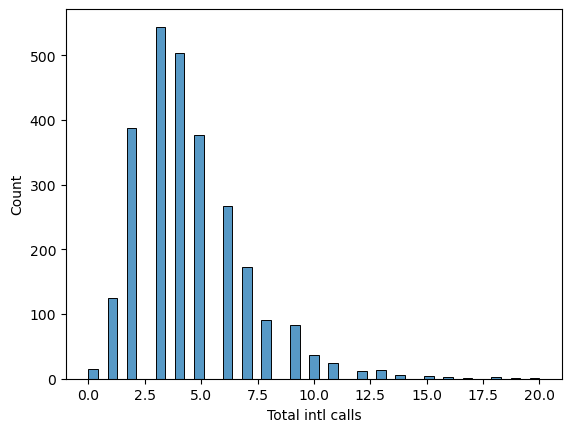

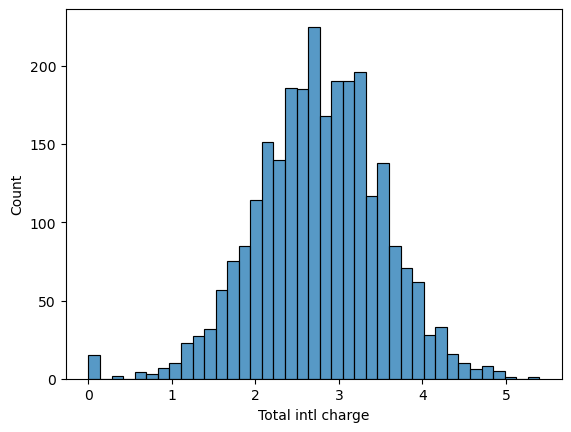

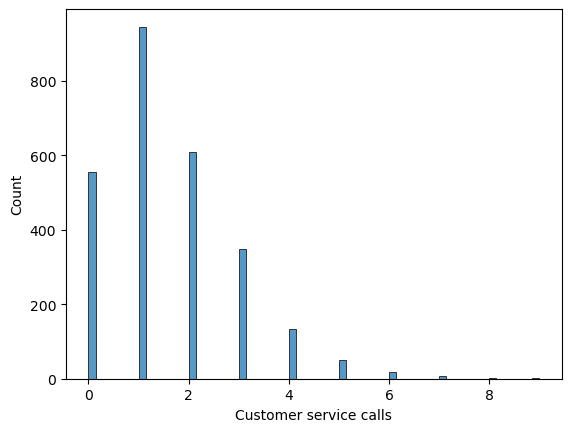

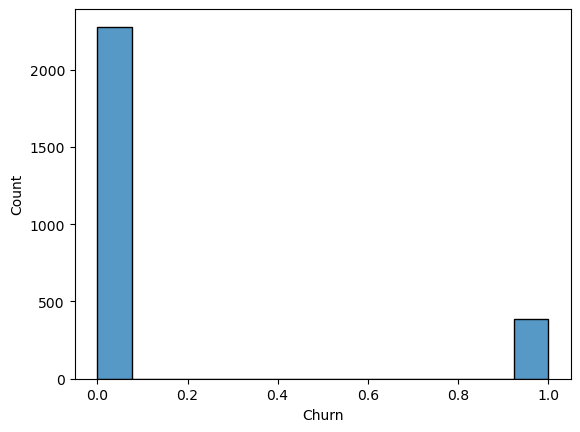

In [5]:
# BONUS - Plotting with a for loop

# What does the distribution for each feature look like?
import seaborn as sns

for i, col in enumerate(df_train.columns):
    plt.figure(i)
    sns.histplot(df_train[col])

#### Note:
The churn is an imbalanced data

### Select features and label

In [49]:
#df_train["Churn"] = df_train["Churn"].astype(int)
#df_train["Churn"].value_counts()

0    2278
1     388
Name: Churn, dtype: int64

In [5]:
df_train.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [98]:
df_test.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [66]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [6]:
df_train.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [7]:
df_test.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

### Convert Categorical features to One-Hot-Encoding
Just take one column to not repeat (redundent). 

In [8]:
df_train[['Area code', 'Churn']] = df_train[['Area code', 'Churn']].astype('category')

In [9]:
df_test[['Area code', 'Churn']] = df_test[['Area code', 'Churn']].astype('category')

In [ ]:
#df_train1 = pd.get_dummies(df_train['Area code'], prefix='Area code')

In [72]:
#df_train.info()

In [10]:
df_train1 = pd.get_dummies(df_train, columns=['Area code', 'International plan', 'Voice mail plan', 'Churn'])

In [11]:
df_test1 = pd.get_dummies(df_test, columns=['Area code', 'International plan', 'Voice mail plan', 'Churn'])

In [10]:
df_train1

,State,Account length,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,...,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_No,International plan_Yes,Voice mail plan_No,Voice mail plan_Yes,Churn_False,Churn_True
0,KS,128,25,265.1,110,45.07,197.4,99,16.78,244.7,...,1,0,1,0,1,0,0,1,1,0
1,OH,107,26,161.6,123,27.47,195.5,103,16.62,254.4,...,1,0,1,0,1,0,0,1,1,0
2,NJ,137,0,243.4,114,41.38,121.2,110,10.30,162.6,...,0,0,1,0,1,0,1,0,1,0
3,OH,84,0,299.4,71,50.90,61.9,88,5.26,196.9,...,2,1,0,0,0,1,1,0,1,0
4,OK,75,0,166.7,113,28.34,148.3,122,12.61,186.9,...,3,0,1,0,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,SC,79,0,134.7,98,22.90,189.7,68,16.12,221.4,...,2,0,1,0,1,0,1,0,1,0
2662,AZ,192,36,156.2,77,26.55,215.5,126,18.32,279.1,...,2,0,1,0,1,0,0,1,1,0
2663,WV,68,0,231.1,57,39.29,153.4,55,13.04,191.3,...,3,0,1,0,1,0,1,0,1,0
2664,RI,28,0,180.8,109,30.74,288.8,58,24.55,191.9,...,2,0,0,1,1,0,1,0,1,0


In [12]:
df_train1 = df_train1.drop(columns= ['State', 'Account length', 'International plan_No', 'Voice mail plan_No', 'Churn_False'])

In [13]:
df_test1 = df_test1.drop(columns= ['State', 'Account length', 'International plan_No', 'Voice mail plan_No', 'Churn_False'])

In [14]:
df_train1

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True
0,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,1,0,0,1,0
1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0,0,1,0
2,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,1,0,0,0,0
3,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1,0,0,1,0,0
4,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0,1,0,0,0,0
2662,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0,1,0,0,1,0
2663,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0,1,0,0,0,0
2664,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0,0,1,0,0,0


In [15]:
df_train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Number vmail messages   2666 non-null   int64  
 1   Total day minutes       2666 non-null   float64
 2   Total day calls         2666 non-null   int64  
 3   Total day charge        2666 non-null   float64
 4   Total eve minutes       2666 non-null   float64
 5   Total eve calls         2666 non-null   int64  
 6   Total eve charge        2666 non-null   float64
 7   Total night minutes     2666 non-null   float64
 8   Total night calls       2666 non-null   int64  
 9   Total night charge      2666 non-null   float64
 10  Total intl minutes      2666 non-null   float64
 11  Total intl calls        2666 non-null   int64  
 12  Total intl charge       2666 non-null   float64
 13  Customer service calls  2666 non-null   int64  
 14  Area code_408           2666 non-null   

### Check duplicate

In [13]:
df_test1[df_test1.duplicated()]

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True


In [14]:
df_train1[df_train1.duplicated()]

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True


No duplicate

In [16]:
df_train1['Churn_True'].sum() / len(df_train1['Churn_True'])

0.145536384096024

In [17]:
df_test1.corr()

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True
Number vmail messages,1.000000,-0.069172,-0.009952,-0.069187,0.040865,-0.051951,0.040876,0.039751,0.003367,0.039680,0.029949,-0.036847,0.029999,0.007859,-0.037940,0.041509,-0.009935,0.023145,0.956168,-0.102381
Total day minutes,-0.069172,1.000000,-0.032306,1.000000,0.017987,0.043219,0.017945,-0.031600,0.052761,-0.031603,-0.006725,0.016597,-0.006841,0.029291,-0.057722,0.008638,0.048577,0.050915,-0.060599,0.242781
Total day calls,-0.009952,-0.032306,1.000000,-0.032319,-0.004688,0.005851,-0.004664,0.079536,-0.030074,0.079529,-0.015319,-0.005155,-0.015201,-0.045953,-0.044202,0.049173,-0.012525,0.040889,-0.025318,0.019360
Total day charge,-0.069187,1.000000,-0.032319,1.000000,0.017983,0.043231,0.017941,-0.031613,0.052748,-0.031616,-0.006720,0.016582,-0.006836,0.029290,-0.057729,0.008658,0.048561,0.050903,-0.060612,0.242777
Total eve minutes,0.040865,0.017987,-0.004688,0.017983,1.000000,-0.029077,1.000000,-0.007705,0.001938,-0.007603,-0.027855,0.002929,-0.027887,-0.012213,-0.015281,-0.000811,0.016480,-0.011273,0.030493,0.175614
Total eve calls,-0.051951,0.043219,0.005851,0.043231,-0.029077,1.000000,-0.029089,-0.009856,0.036068,-0.009833,-0.001050,0.074829,-0.001152,0.008126,0.006268,-0.021486,0.018734,-0.012082,-0.048341,0.055669
Total eve charge,0.040876,0.017945,-0.004664,0.017941,1.000000,-0.029089,1.000000,-0.007691,0.001939,-0.007589,-0.027863,0.002894,-0.027895,-0.012212,-0.015255,-0.000855,0.016504,-0.011274,0.030501,0.175616
Total night minutes,0.039751,-0.031600,0.079536,-0.031613,-0.007705,-0.009856,-0.007691,1.000000,0.005209,0.999999,-0.041969,-0.057212,-0.042221,-0.067602,-0.032826,0.045457,-0.019746,-0.115659,0.026803,0.042930
Total night calls,0.003367,0.052761,-0.030074,0.052748,0.001938,0.036068,0.001939,0.005209,1.000000,0.005195,0.024038,-0.072354,0.023863,-0.039794,0.024239,-0.054655,0.039221,-0.011561,0.021533,-0.017626
Total night charge,0.039680,-0.031603,0.079529,-0.031616,-0.007603,-0.009833,-0.007589,0.999999,0.005195,1.000000,-0.041969,-0.057129,-0.042220,-0.067624,-0.032792,0.045413,-0.019729,-0.115669,0.026723,0.042958


In [18]:
df_train1.corr()

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True
Number vmail messages,1.000000,0.019027,-0.009622,0.019027,0.011401,0.005131,0.011418,-0.000224,0.008124,-0.000229,-0.004156,0.027013,-0.004136,-0.018787,-0.013194,0.012807,-0.001567,0.005858,0.957159,-0.086474
Total day minutes,0.019027,1.000000,0.016780,1.000000,0.003999,0.009059,0.003992,0.013491,0.015054,0.013464,-0.011042,0.005687,-0.010934,-0.024543,-0.019979,0.039307,-0.025226,0.049550,0.013438,0.195688
Total day calls,-0.009622,0.016780,1.000000,0.016787,-0.026003,0.006473,-0.026006,0.008986,-0.016776,0.008972,0.031036,0.006928,0.031133,-0.011945,0.013484,-0.003936,-0.008901,-0.004277,-0.007541,0.018290
Total day charge,0.019027,1.000000,0.016787,1.000000,0.004008,0.009056,0.004002,0.013495,0.015057,0.013468,-0.011046,0.005688,-0.010938,-0.024548,-0.019984,0.039309,-0.025223,0.049555,0.013439,0.195689
Total eve minutes,0.011401,0.003999,-0.026003,0.004008,1.000000,-0.007654,1.000000,-0.013414,0.009017,-0.013450,-0.006915,0.002160,-0.006947,-0.013192,0.008000,-0.008057,0.001284,0.026616,0.019132,0.072906
Total eve calls,0.005131,0.009059,0.006473,0.009056,-0.007654,1.000000,-0.007642,-0.000175,0.000797,-0.000135,0.011012,0.003710,0.011000,0.001058,-0.013211,0.028950,-0.020075,0.010277,0.003404,-0.001539
Total eve charge,0.011418,0.003992,-0.026006,0.004002,1.000000,-0.007642,1.000000,-0.013428,0.009030,-0.013464,-0.006923,0.002169,-0.006955,-0.013196,0.007983,-0.008065,0.001311,0.026623,0.019147,0.072893
Total night minutes,-0.000224,0.013491,0.008986,0.013495,-0.013414,-0.000175,-0.013428,1.000000,0.012736,0.999999,-0.008607,-0.001110,-0.008510,0.005236,-0.015565,0.017493,-0.004585,-0.010310,0.001065,0.033639
Total night calls,0.008124,0.015054,-0.016776,0.015057,0.009017,0.000797,0.009030,0.012736,1.000000,0.012720,-0.023447,0.019367,-0.023434,-0.005677,-0.046211,0.032772,0.008378,0.018081,0.013985,0.012262
Total night charge,-0.000229,0.013464,0.008972,0.013468,-0.013450,-0.000135,-0.013464,0.999999,0.012720,1.000000,-0.008615,-0.001099,-0.008517,0.005257,-0.015560,0.017514,-0.004615,-0.010316,0.001066,0.033635


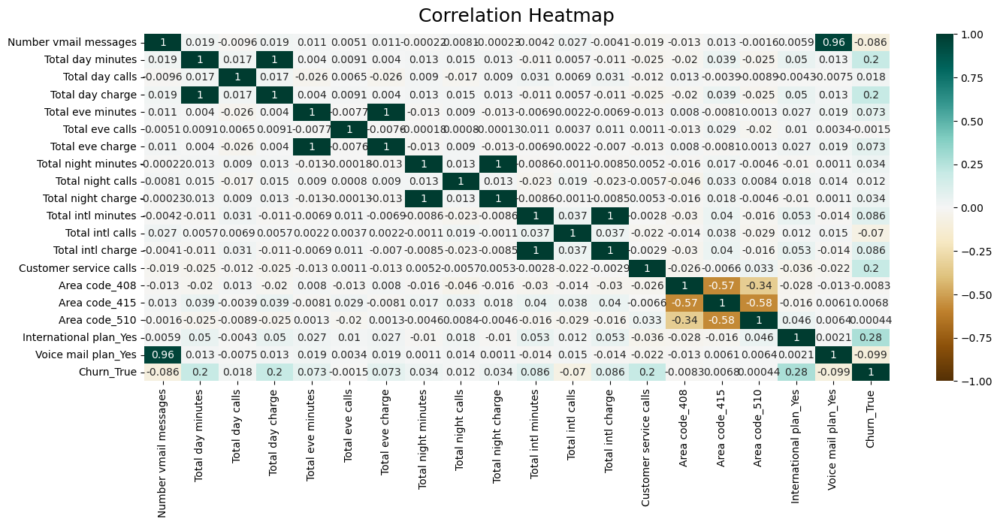

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_train1.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);

plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [129]:
#df_train2['Total_minutes'] = df_train['Total day minutes'] + df_train['Total eve minutes'] + df_train['Total night minutes']

In [130]:
#df_train2['Total_Charge'] = df_train['Total day charge'] + df_train['Total eve charge'] + df_train['Total night charge']

In [131]:
#df_train2['Total_Call'] = df_train['Total day calls'] + df_train['Total eve calls'] + df_train['Total night calls']

### Check Values

In [19]:
df_train1['Customer service calls'].value_counts()

1    945
2    608
0    555
3    348
4    133
5     49
6     17
7      8
9      2
8      1
Name: Customer service calls, dtype: int64

In [92]:
df_train1

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes,Churn_True
0,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,1,0,0,1,0
1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0,0,1,0
2,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,1,0,0,0,0
3,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1,0,0,1,0,0
4,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0,1,0,0,0,0
2662,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0,1,0,0,1,0
2663,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0,1,0,0,0,0
2664,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0,0,1,0,0,0


In [ ]:
#df_train2['Churn'] = df_train2.pop("Churn")

## Basic XGBoost Model

In [19]:
X_train, y_train = df_train1.iloc[:,:-1],df_train1.iloc[:,-1]

In [20]:
X_train

,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Area code_408,Area code_415,Area code_510,International plan_Yes,Voice mail plan_Yes
0,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,1,0,0,1
1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,1,0,0,1
2,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,1,0,0,0
3,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1,0,0,1,0
4,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2661,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0,1,0,0,0
2662,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0,1,0,0,1
2663,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0,1,0,0,0
2664,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0,0,1,0,0


In [21]:
y_train

0       0
1       0
2       0
3       0
4       0
       ..
2661    0
2662    0
2663    0
2664    0
2665    0
Name: Churn_True, Length: 2666, dtype: uint8

In [22]:
sum(y_train) / len(y_train)

0.145536384096024

In [23]:
X_test, y_test = df_test1.iloc[:,:-1],df_test1.iloc[:,-1]

In [25]:
sum(y_test) / len(y_test)

0.1424287856071964

In [ ]:
# split data into train and test sets
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=7)

In [60]:
# fit model no training data
model = XGBClassifier()
eval_set = [(X_test, y_test)]
model.fit(X_train, y_train, eval_metric="error", eval_set=eval_set, verbose=True)

[0]	validation_0-error:0.04798
[1]	validation_0-error:0.04648
[2]	validation_0-error:0.04198
[3]	validation_0-error:0.04498
[4]	validation_0-error:0.04348
[5]	validation_0-error:0.04498
[6]	validation_0-error:0.04198
[7]	validation_0-error:0.04048
[8]	validation_0-error:0.04048
[9]	validation_0-error:0.04048
[10]	validation_0-error:0.03898
[11]	validation_0-error:0.04348
[12]	validation_0-error:0.04198
[13]	validation_0-error:0.04198
[14]	validation_0-error:0.03898
[15]	validation_0-error:0.03748
[16]	validation_0-error:0.03898
[17]	validation_0-error:0.03898
[18]	validation_0-error:0.03898
[19]	validation_0-error:0.04048
[20]	validation_0-error:0.04048
[21]	validation_0-error:0.03898
[22]	validation_0-error:0.03898
[23]	validation_0-error:0.03898
[24]	validation_0-error:0.03898
[25]	validation_0-error:0.03748
[26]	validation_0-error:0.03898
[27]	validation_0-error:0.03748
[28]	validation_0-error:0.04048
[29]	validation_0-error:0.04048
[30]	validation_0-error:0.03898
[31]	validation_0-

C:\Users\alhai\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[37]	validation_0-error:0.04048
[38]	validation_0-error:0.04048
[39]	validation_0-error:0.04198
[40]	validation_0-error:0.04198
[41]	validation_0-error:0.04048
[42]	validation_0-error:0.04048
[43]	validation_0-error:0.04048
[44]	validation_0-error:0.03898
[45]	validation_0-error:0.03898
[46]	validation_0-error:0.03898
[47]	validation_0-error:0.03748
[48]	validation_0-error:0.03748
[49]	validation_0-error:0.03748
[50]	validation_0-error:0.03748
[51]	validation_0-error:0.03898
[52]	validation_0-error:0.03598
[53]	validation_0-error:0.03748
[54]	validation_0-error:0.03748
[55]	validation_0-error:0.03748
[56]	validation_0-error:0.03748
[57]	validation_0-error:0.03748
[58]	validation_0-error:0.03748
[59]	validation_0-error:0.03748
[60]	validation_0-error:0.03748
[61]	validation_0-error:0.03748
[62]	validation_0-error:0.03748
[63]	validation_0-error:0.03748
[64]	validation_0-error:0.03748
[65]	validation_0-error:0.03748
[66]	validation_0-error:0.03748
[67]	validation_0-error:0.03748
[68]	val

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [61]:
# make predictions for test data
y_pred = model.predict(X_test)

In [62]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))

RMSE: 0.197435


In [28]:
from sklearn.metrics import accuracy_score

predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 96.10%


Reviewing all of the output, we can see that the model performance on the test set sits flat and even gets worse towards the end of training.

Evaluate XGBoost Models With Learning Curves
We can retrieve the performance of the model on the evaluation dataset and plot it to get insight into how learning unfolded while training.

We provide an array of X and y pairs to the eval_metric argument when fitting our XGBoost model. In addition to a test set, we can also provide the training dataset. This will provide a report on how well the model is performing on both training and test sets during training.

For example:

We can then use these collected performance measures to create a line plot and gain further insight into how the model behaved on train and test datasets over training epochs.

Below is the complete code example showing how the collected results can be visualized on a line plot.

In [29]:
# fit model no training data
model = XGBClassifier()
eval_set = [(X_train, y_train), (X_test, y_test)]
model.fit(X_train, y_train, eval_metric=["error", "logloss"], eval_set=eval_set, verbose=True)

[0]	validation_0-error:0.04351	validation_0-logloss:0.48028	validation_1-error:0.04798	validation_1-logloss:0.48316
[1]	validation_0-error:0.03938	validation_0-logloss:0.35843	validation_1-error:0.04648	validation_1-logloss:0.36544
[2]	validation_0-error:0.03788	validation_0-logloss:0.28394	validation_1-error:0.04198	validation_1-logloss:0.29215
[3]	validation_0-error:0.03188	validation_0-logloss:0.23000	validation_1-error:0.04498	validation_1-logloss:0.24218
[4]	validation_0-error:0.02738	validation_0-logloss:0.19217	validation_1-error:0.04348	validation_1-logloss:0.20738
[5]	validation_0-error:0.02401	validation_0-logloss:0.16598	validation_1-error:0.04498	validation_1-logloss:0.18609
[6]	validation_0-error:0.02438	validation_0-logloss:0.14792	validation_1-error:0.04198	validation_1-logloss:0.17021
[7]	validation_0-error:0.02363	validation_0-logloss:0.13509	validation_1-error:0.04048	validation_1-logloss:0.15981
[8]	validation_0-error:0.02213	validation_0-logloss:0.12325	validation_1

C:\Users\alhai\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[34]	validation_0-error:0.01463	validation_0-logloss:0.04455	validation_1-error:0.04198	validation_1-logloss:0.15361
[35]	validation_0-error:0.01350	validation_0-logloss:0.04369	validation_1-error:0.04048	validation_1-logloss:0.15411
[36]	validation_0-error:0.01313	validation_0-logloss:0.04233	validation_1-error:0.04048	validation_1-logloss:0.15471
[37]	validation_0-error:0.01238	validation_0-logloss:0.04044	validation_1-error:0.04048	validation_1-logloss:0.15653
[38]	validation_0-error:0.01125	validation_0-logloss:0.03882	validation_1-error:0.04048	validation_1-logloss:0.15779
[39]	validation_0-error:0.00975	validation_0-logloss:0.03733	validation_1-error:0.04198	validation_1-logloss:0.15920
[40]	validation_0-error:0.00900	validation_0-logloss:0.03627	validation_1-error:0.04198	validation_1-logloss:0.15988
[41]	validation_0-error:0.00938	validation_0-logloss:0.03570	validation_1-error:0.04048	validation_1-logloss:0.15960
[42]	validation_0-error:0.00863	validation_0-logloss:0.03422	val

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [30]:
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))


Accuracy: 96.10%


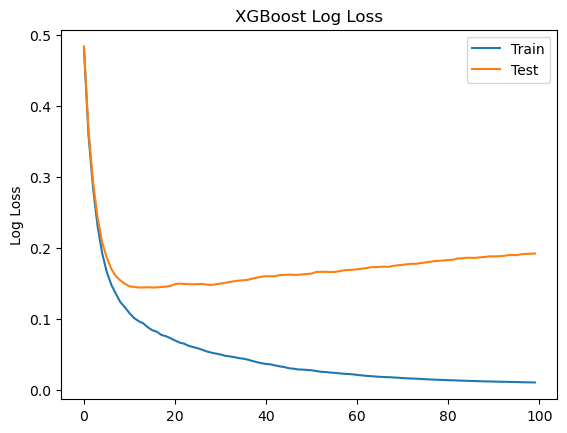

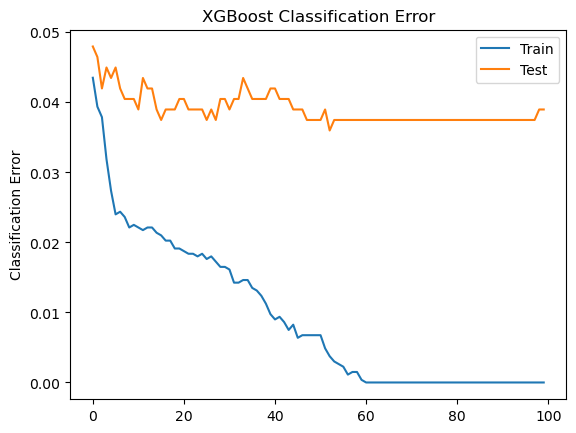

In [31]:
from matplotlib import pyplot

# retrieve performance metrics
results = model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
pyplot.ylabel('Log Loss')
pyplot.title('XGBoost Log Loss')
pyplot.show()
# plot classification error
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['error'], label='Train')
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.legend()
pyplot.ylabel('Classification Error')
pyplot.title('XGBoost Classification Error')
pyplot.show()

Running this code reports the classification error on both the train and test datasets each epoch. We can turn this off by setting verbose=False (the default) in the call to the fit() function.

Note: Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.

Two plots are created. The first shows the logarithmic loss of the XGBoost model for each epoch on the training and test datasets.

The second plot shows the classification error of the XGBoost model for each epoch on the training and test datasets.



From reviewing the logloss plot, it looks like there is an opportunity to stop the learning early, perhaps somewhere around epoch 20 to epoch 40.

We see a similar story for classification error, where error appears to go back up at around epoch 40.

If multiple evaluation datasets or multiple evaluation metrics are provided, then early stopping will use the last in the list.

Below provides a full example for completeness with early stopping.

In [46]:

# fit model no training data
model = XGBClassifier()
eval_set = [(X_train, y_train), (X_test, y_test)]
#eval_set = [(X_test, y_test)]
model.fit(X_train, y_train, early_stopping_rounds=10, eval_metric=["error", "logloss"], eval_set=eval_set, verbose=True)
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[0]	validation_0-error:0.04351	validation_0-logloss:0.48028	validation_1-error:0.04798	validation_1-logloss:0.48316
[1]	validation_0-error:0.03938	validation_0-logloss:0.35843	validation_1-error:0.04648	validation_1-logloss:0.36544
[2]	validation_0-error:0.03788	validation_0-logloss:0.28394	validation_1-error:0.04198	validation_1-logloss:0.29215
[3]	validation_0-error:0.03188	validation_0-logloss:0.23000	validation_1-error:0.04498	validation_1-logloss:0.24218
[4]	validation_0-error:0.02738	validation_0-logloss:0.19217	validation_1-error:0.04348	validation_1-logloss:0.20738
[5]	validation_0-error:0.02401	validation_0-logloss:0.16598	validation_1-error:0.04498	validation_1-logloss:0.18609
[6]	validation_0-error:0.02438	validation_0-logloss:0.14792	validation_1-error:0.04198	validation_1-logloss:0.17021
[7]	validation_0-error:0.02363	validation_0-logloss:0.13509	validation_1-error:0.04048	validation_1-logloss:0.15981
[8]	validation_0-error:0.02213	validation_0-logloss:0.12325	validation_1

C:\Users\alhai\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
C:\Users\alhai\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


Note: Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.

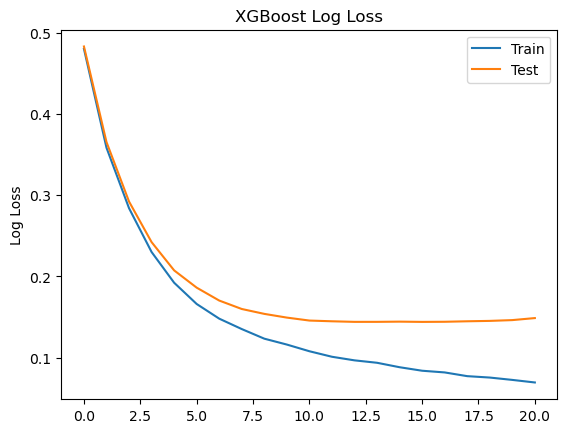

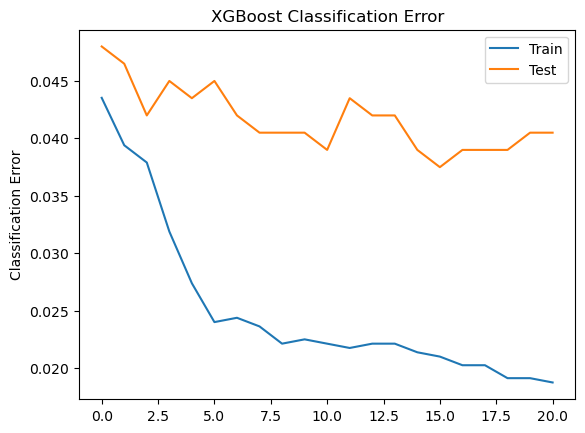

In [33]:
from matplotlib import pyplot

# retrieve performance metrics
results = model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
pyplot.ylabel('Log Loss')
pyplot.title('XGBoost Log Loss')
pyplot.show()
# plot classification error
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['error'], label='Train')
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.legend()
pyplot.ylabel('Classification Error')
pyplot.title('XGBoost Classification Error')
pyplot.show()

We can see that the model stopped training at epoch 42 (close to what we expected by our manual judgment of learning curves) and that the model with the best loss was observed at epoch 32.

It is generally a good idea to select the early_stopping_rounds as a reasonable function of the total number of training epochs (10% in this case) or attempt to correspond to the period of inflection points as might be observed on plots of learning curves.

0.91


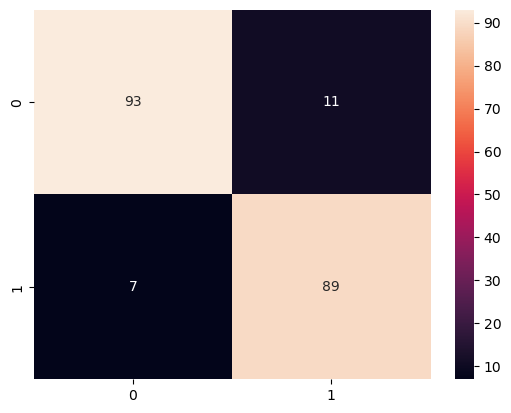

In [38]:
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split

# define dataset
X, y = make_classification(n_samples=1000, n_features=10, n_informative=8)
Xa,Xb,ya,yb = train_test_split(X, y, test_size=0.2, shuffle=True)
xgbc = xgb.XGBClassifier()
xgbc.fit(Xa,ya)
yp = xgbc.predict(Xb)
acc = accuracy_score(yb,yp)
print(acc)
cm = confusion_matrix(yp,yb)
sns.heatmap(cm,annot=True)
plt.show()

<Axes: >

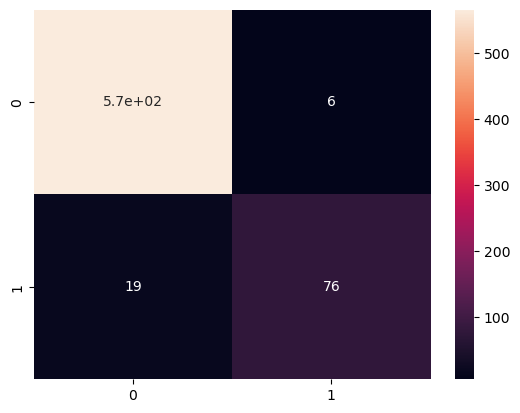

In [40]:
#Lets explore the results
from sklearn.metrics import confusion_matrix,classification_report

cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True)

In [47]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       572
           1       0.93      0.80      0.86        95

    accuracy                           0.96       667
   macro avg       0.95      0.89      0.92       667
weighted avg       0.96      0.96      0.96       667



In [ ]:
sns.distplot(y_test-y_pred)

In [97]:
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle = True, random_state = 999)
kfold = KFold(n_splits=10)
results = cross_val_score(model,X_train,y_train,cv=kfold)
print(np.round(results.mean()*100,2),np.round(results.std()*100))

95.46 2.0


In [98]:
results

array([0.94756554, 0.96254682, 0.9588015 , 0.94756554, 0.94756554,
       0.9588015 , 0.98120301, 0.94360902, 0.92481203, 0.97368421])

## Pipeline and GridSearch

In [142]:
model = xgb.XGBClassifier()

pipeline = Pipeline([
    ('standard_scaler', StandardScaler()), 
    ('pca', PCA()), 
    ('model', model)
])

param_grid = {
    'pca__n_components': [5, 10, 15, 20, 25, 30],
    'model__max_depth': [2, 3, 5, 7, 10],
    'model__n_estimators': [10, 100, 500],
}

grid = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='roc_auc', return_train_score=True) 

In [91]:
grid

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standard_scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None, gpu_id=None,
                                                      grow_polic...
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [2, 3, 5, 7, 10],
                         'model__n_estimators': [10, 100, 500],
                         'pca__n_components': [5, 10, 15, 20, 25, 30]},
             scoring='roc_auc')

In [143]:
%%time

grid.fit(X_train, y_train)

C:\Users\alhai\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
225 fits failed out of a total of 450.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
75 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\alhai\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\alhai\anaconda3\lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\alhai\anaconda3\lib\site-packages\sklearn\pipeline.py", line 416, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\alhai\anaconda3

CPU times: total: 3.97 s
Wall time: 18.7 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standard_scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('model',
                                        XGBClassifier(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=None,
                                                      colsample_bynode=None,
                                                      colsample_bytree=None,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric=None,
                                                      feature_types=None,
                                                      gamma=None, gpu_id=None,
                                                      grow_polic...
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [2, 3, 5, 7, 10],
                         'model__n_estimators': [10, 100, 500],
                         'pca__n_components': [5, 10, 15, 20, 25, 30]},
             return_train_score=True, scoring='roc_auc')

In [146]:
mean_train_score = grid.cv_results_["mean_train_score"][grid.best_index_]
std_train_score = grid.cv_results_["std_train_score"][grid.best_index_]
mean_test_score = grid.cv_results_["mean_test_score"][grid.best_index_]
std_test_score = grid.cv_results_["std_test_score"][grid.best_index_]

grid.best_params_, mean_train_score, std_train_score, mean_test_score, std_test_score 

print(f"Best parameters: {grid.best_params_}")
print(f"Mean train CV score: {mean_train_score: .6f}")
print(f"train Standard deviation of CV score: {std_train_score: .6f}")
print(f"Mean test CV score: {mean_test_score: .6f}")
print(f"test Standard deviation of CV score: {std_test_score: .6f}")

Best parameters: {'model__max_depth': 10, 'model__n_estimators': 100, 'pca__n_components': 15}
Mean train CV score:  1.000000
train Standard deviation of CV score:  0.000000
Mean test CV score:  0.883973
test Standard deviation of CV score:  0.031278


{'alpha': array([1.00000000e-03, 3.16227766e-03, 1.00000000e-02, 3.16227766e-02,
       1.00000000e-01, 3.16227766e-01, 1.00000000e+00, 3.16227766e+00,
       1.00000000e+01, 3.16227766e+01, 1.00000000e+02, 3.16227766e+02,
       1.00000000e+03])}
Best cross-validation score: 0.65
Best parameters:  {'alpha': 0.03162277660168379}


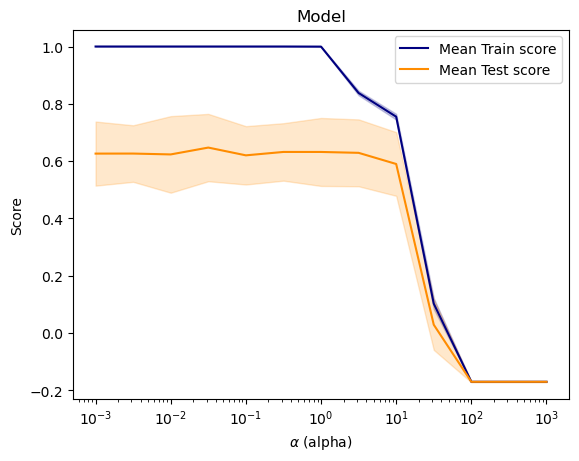

In [152]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import fetch_california_housing

param_grid = {'alpha': np.logspace(-3, 3, 13)}
print(param_grid)

model = xgb.XGBClassifier()
grid = GridSearchCV(model, param_grid,
                    cv=10, return_train_score=True, scoring='r2')
grid.fit(X_train, y_train)
print("Best cross-validation score: {:.2f}".format(grid.best_score_))
print("Best parameters: ", grid.best_params_)


alphas = np.logspace(-3, 3, 13)

train_scores_mean = grid.cv_results_["mean_train_score"]
train_scores_std = grid.cv_results_["std_train_score"]
test_scores_mean = grid.cv_results_["mean_test_score"]
test_scores_std = grid.cv_results_["std_test_score"]

plt.figure()
plt.title('Model')
plt.xlabel('$\\alpha$ (alpha)')
plt.ylabel('Score')
# plot train scores
plt.semilogx(alphas, train_scores_mean, label='Mean Train score',
             color='navy')
# create a shaded area between [mean - std, mean + std]
plt.gca().fill_between(alphas,
                       train_scores_mean - train_scores_std,
                       train_scores_mean + train_scores_std,
                       alpha=0.2,
                       color='navy')
plt.semilogx(alphas, test_scores_mean,
             label='Mean Test score', color='darkorange')

# create a shaded area between [mean - std, mean + std]
plt.gca().fill_between(alphas,
                       test_scores_mean - test_scores_std,
                       test_scores_mean + test_scores_std,
                       alpha=0.2,
                       color='darkorange')

plt.legend(loc='best')
plt.show()

https://www.intel.com/content/www/us/en/developer/articles/technical/gradient-boosting-with-xgboost.html

In [162]:
from sklearn.tree import DecisionTreeClassifier
 
tree = DecisionTreeClassifier(random_state=42)
 
# fit the model
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [163]:
# Predict and test on test data
y_hat = tree.predict(X_test)
accuracy_score(y_test, y_hat)

0.9115442278860569

In [164]:
from sklearn.ensemble import GradientBoostingClassifier

boostedTree = GradientBoostingClassifier(random_state=42)
boostedTree = boostedTree.fit(X_train, y_train)

boosted_y_hat = boostedTree.predict(X_test)
accuracy_score(y_test, boosted_y_hat)

0.9565217391304348

In [165]:
boostedTree.feature_importances_

array([0.04927432, 0.18739646, 0.0038372 , 0.08288888, 0.05545274,
       0.00156625, 0.07065986, 0.01720074, 0.00188704, 0.0051475 ,
       0.02900183, 0.09333112, 0.08553985, 0.17386416, 0.        ,
       0.00041869, 0.        , 0.11467708, 0.02785627])

In [169]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import warnings
#import category_encoders as ce
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import time
import warnings

In [166]:
from xgboost import XGBClassifier
 
xgb = XGBClassifier(eval_metric='mlogloss')
xgb.fit(X_train, y_train)

# Predict and test on test data
xgb_y_hat = xgb.predict(X_test)
accuracy_score(y_test, xgb_y_hat)

0.9610194902548725

In [170]:
from sklearn import model_selection
 
models = [('TR', tree),
          ('BT', boostedTree),
          ('XGB', xgb)]
 
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    time_start = time.time()
    kfold = model_selection.KFold(n_splits=10)
    cv_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    time_end = time.time()
    msg = f"{name}: Mean score {cv_results.mean()} - Std {cv_results.std()} - Seconds {round((time_end - time_start), 3)}"

In [171]:
results 

[array([0.91011236, 0.90636704, 0.917603  , 0.92134831, 0.90636704,
        0.90262172, 0.92481203, 0.90601504, 0.88345865, 0.93609023]),
 array([0.94756554, 0.95505618, 0.95505618, 0.9588015 , 0.94756554,
        0.95131086, 0.96992481, 0.94360902, 0.92857143, 0.95864662]),
 array([0.94756554, 0.96254682, 0.9588015 , 0.94756554, 0.94756554,
        0.9588015 , 0.98120301, 0.94360902, 0.92481203, 0.97368421])]

In [172]:
names

['TR', 'BT', 'XGB']

In [173]:
msg

'XGB: Mean score 0.9546154712624256 - Std 0.015254367447725169 - Seconds 2.404'

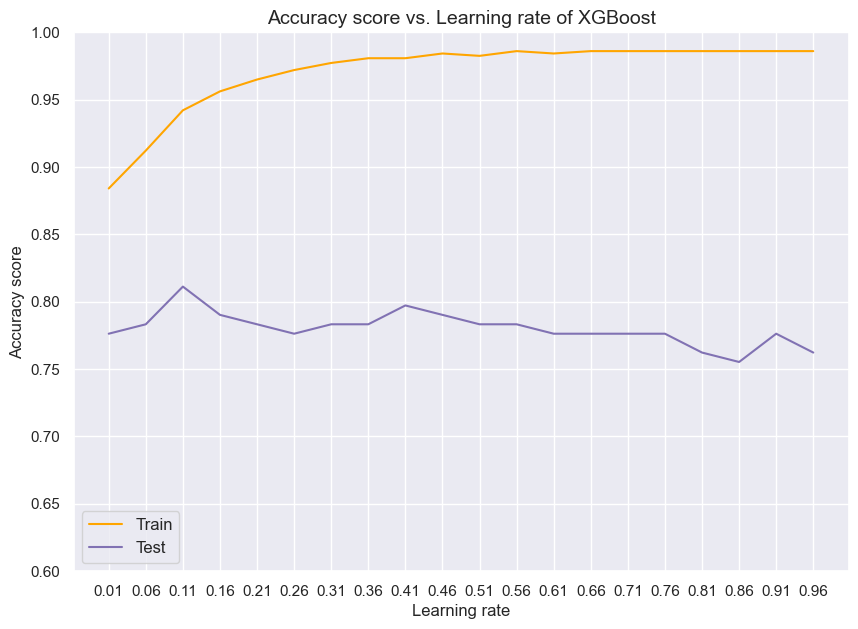

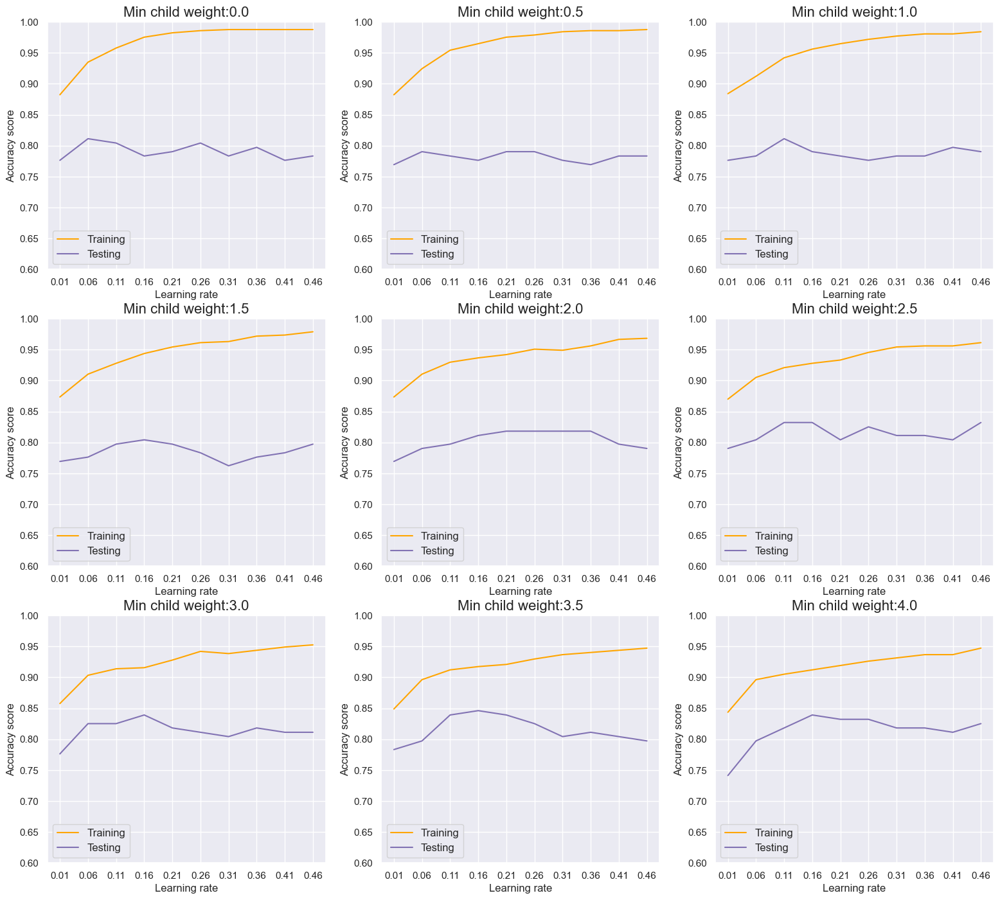

In [178]:
# Import packages
import pandas as pd
from sklearn.preprocessing import LabelEncoder          
from sklearn.model_selection import train_test_split  
import matplotlib.pyplot as plt 
import numpy as np
import xgboost as xgb

# Read data
url = 'https://raw.githubusercontent.com/datasciencedojo/datasets/master/titanic.csv'
data = pd.read_csv(url)

# Check missing values
data.isnull().sum()
# Drop columns with too many missing values
data.drop('Cabin', axis=1, inplace=True)
# Drop data with missing values 
data.dropna(inplace=True)

# Inspect data
data.head()
# Transfrom attribute
le = LabelEncoder()
data['Sex'] = le.fit_transform(data['Sex'])

# Decide variables to use
X = data[['Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare']]
y = data['Survived']

# train/test split (80/20)
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=65)

# XGBoost (different learning rate)
learning_rate_range = np.arange(0.01, 1, 0.05)
test_XG = [] 
train_XG = []
for lr in learning_rate_range:
    xgb_classifier = xgb.XGBClassifier(eta = lr)
    xgb_classifier.fit(x_train, y_train)
    train_XG.append(xgb_classifier.score(x_train, y_train))
    test_XG.append(xgb_classifier.score(x_test, y_test))
# Line plot
fig = plt.figure(figsize=(10, 7))
plt.plot(learning_rate_range, train_XG, c='orange', label='Train')
plt.plot(learning_rate_range, test_XG, c='m', label='Test')
plt.xlabel('Learning rate')
plt.xticks(learning_rate_range)
plt.ylabel('Accuracy score')
plt.ylim(0.6, 1)
plt.legend(prop={'size': 12}, loc=3)
plt.title('Accuracy score vs. Learning rate of XGBoost', size=14)
plt.show()

# Resolve overfitting 
# new learning rate range
learning_rate_range = np.arange(0.01, 0.5, 0.05)
fig = plt.figure(figsize=(19, 17))
idx = 1
# grid search for min_child_weight
for weight in np.arange(0, 4.5, 0.5):
    train = []
    test = []
    for lr in learning_rate_range:
        xgb_classifier = xgb.XGBClassifier(eta = lr, reg_lambda=1, min_child_weight=weight)
        xgb_classifier.fit(x_train, y_train)
        train.append(xgb_classifier.score(x_train, y_train))
        test.append(xgb_classifier.score(x_test, y_test))
    fig.add_subplot(3, 3, idx)
    idx += 1
    plt.plot(learning_rate_range, train, c='orange', label='Training')
    plt.plot(learning_rate_range, test, c='m', label='Testing')
    plt.xlabel('Learning rate')
    plt.xticks(learning_rate_range)
    plt.ylabel('Accuracy score')
    plt.ylim(0.6, 1)
    plt.legend(prop={'size': 12}, loc=3)
    title = "Min child weight:" + str(weight)
    plt.title(title, size=16)
plt.show()

In [175]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, n_estimators = 10)

xg_reg.fit(X_train,y_train)

preds = xg_reg.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

# Note that here you are using the Dmatrix object you created before.
cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)


cv_results

print(cv_results.tail(1))

xg_reg = xgb.train(params=params, dtrain=data_dmatrix, num_boost_round=10)

import matplotlib
%matplotlib inline

xgb.plot_tree(xg_reg,num_trees=0)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(150, 100)
# fig.savefig('tree.png')

xgb.plot_importance(xg_reg)
fig = matplotlib.pyplot.gcf()



0.9610194902548725

#  XGBoost API

In [117]:
dftrain = xgb.DMatrix(X_train, y_train)
dftest = xgb.DMatrix(X_test, y_test)

In [99]:
params = {"objective":"reg:squarederror", "base_score":0.5, "booster":"gbtree", "colsample_bylevel":1,
             "colsample_bynode":1, "colsample_bytree":1, "gamma":0, "gpu_id":-1,
              "interaction_constraints":'', "learning_rate":0.300000012, 
              "max_delta_step":0, "max_depth":6, "min_child_weight":1, "importance_type":"gain",
              "monotone_constraints":'()', "missing":None, "n_jobs":8, 
              "num_parallel_tree":1, "random_state":0, "reg_alpha":0, 
              "reg_lambda":1, "scale_pos_weight":1, "subsample":1, "seed":0, 
            "tree_method":"exact", "validate_parameters":1, 
             "verbosity":None, "objective":"binary:logistic", "nthread":-1}
             

In [118]:
bst = xgb.train(params, dftrain)

[18:11:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "importance_type" } are not used.



In [119]:
preds = bst.predict(dftest)

In [120]:
rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))

RMSE: 0.184581


In [121]:
predictions = [round(value) for value in preds]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 95.95%


[18:46:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "importance_type" } are not used.



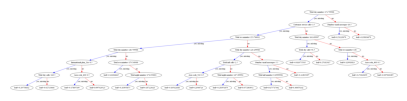

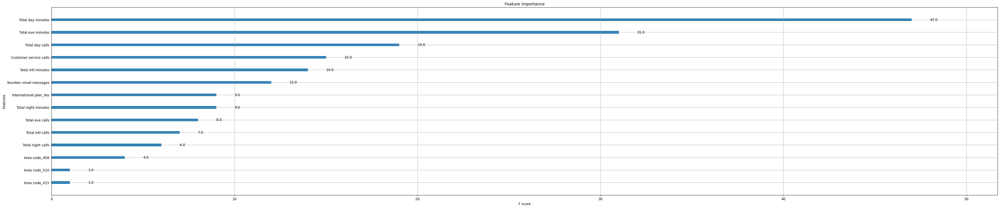

In [141]:
#Visualizing

xg_reg = xgb.train(params=params, dtrain=dftest, num_boost_round=10)

#plot the trees

import matplotlib.pyplot as plt
    
xgb.plot_tree(xg_reg,num_trees=5)
plt.rcParams['figure.figsize'] = [50, 10]
plt.show()

#Examine the importance of each feature column in the original dataset within the model

xgb.plot_importance(xg_reg)

plt.rcParams['figure.figsize'] = [5, 5]

plt.show()

In [ ]:
results = model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)

fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['auc'], label='Train')
ax.plot(x_axis, results['validation_1']['auc'], label='Test')
ax.legend()
pyplot.ylabel('AUC')
pyplot.title('XGBoost AUC')
pyplot.show()

In [ ]:
dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

bst = xgb.train(params, dtrain)

preds = bst.predict(dtest)

rmse = np.sqrt(mean_squared_error(y_test, preds))
print("RMSE: %f" % (rmse))


In [177]:
DTrain = xgb.DMatrix(X_train, y_train)
DTest = xgb.DMatrix(X_test)

params = {"eta":0.3, "objective":"binary:hinge"}
model = xgb.train(params, DTrain, num_boost_round=50)
accuracy_score(model.predict(DTest), y_test)

AttributeError: 'XGBClassifier' object has no attribute 'DMatrix'

In [ ]:
params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

# Note that here you are using the Dmatrix object you created before.
cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics="rmse", as_pandas=True, seed=123)

https://machinelearninghd.com/xgboost-in-python-guide-for-gradient-boosting/

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

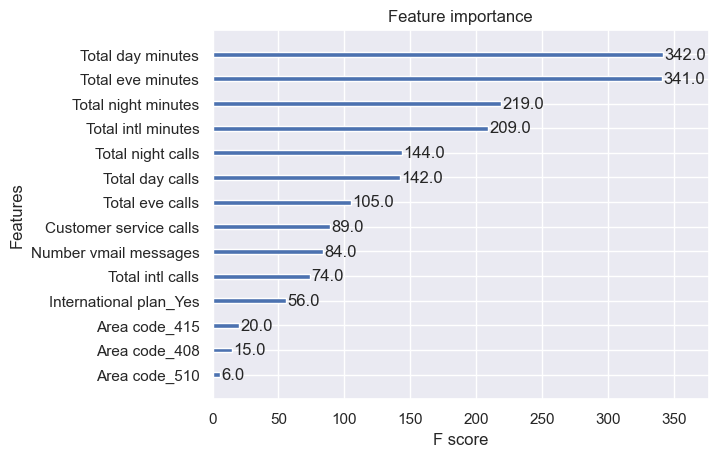

In [179]:
from xgboost import plot_importance
# Plot feature importance
plot_importance(model)

Lets try to see the original XgBoost package and see what results do we get for it.

In [28]:
#Original XgBoost Package
import xgboost
model = xgboost.XGBClassifier()
model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [32]:
#Default Settings in Xgboost Package
from xgboost import XGBClassifier

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, monotone_constraints='()',
       n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
            reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy=None, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=0, max_depth=6, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, predictor=None,
              random_state=0, ...)

<Axes: >

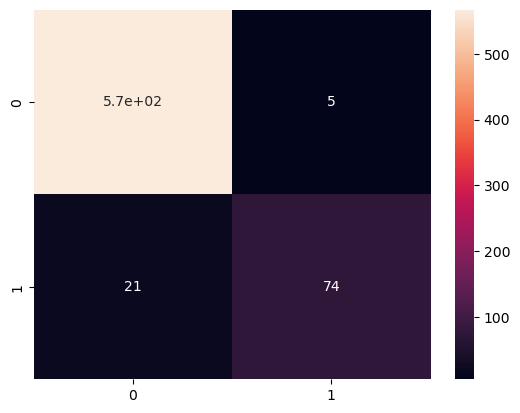

In [34]:
y_pred = model.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm,annot=True)

In [35]:
#Classification Report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       572
           1       0.94      0.78      0.85        95

    accuracy                           0.96       667
   macro avg       0.95      0.89      0.91       667
weighted avg       0.96      0.96      0.96       667



In [37]:
#Importing KFold cross validation from sci-kit learn, 
# also we are using cross val score which allows us to evaluate 
# a model using cross validation

from sklearn.model_selection import KFold,cross_val_score

model = GradientBoostingClassifier()

kfold = KFold(n_splits=10)
results = cross_val_score(model,X_train,y_train,cv=kfold)
print(np.round(results.mean()*100,2),np.round(results.std()*100))

95.2 1.0


If we have classification problems and typically with imbalanced data, it is good idea to use StratifiedKFold Api as it enables us to have same distribution in every split as in training dataset.

In [39]:
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=10)
kfold = KFold(n_splits=10)
results = cross_val_score(model,X_train,y_train,cv=kfold)
print(np.round(results.mean()*100,2),np.round(results.std()*100))

95.16 1.0


Thumbs rules for cross validation:

Use k values as 3,5 or 10
use stratified K-fold if we have imbalanced datasets
Whenever in doubt use Kfold for regression problems and StratifiedKFold in classification problems.

In [ ]:
## Saving the Model
model_filename = 'model.pkl'
with open(model_filename,'wb') as file:
    pickle.dump(model,file)
    

In [ ]:
## At a later time, using the saved model
with open(model_filename,'rb') as file:
    pickle_model = pickle.load(file)

In [ ]:
## Using Saved Model to do predictions
pickle_model.predict(X_test)

In [ ]:
## Saving the Model
dump(model,'xgboost.joblib.data')
print('Moved is saved in your computer location')

Output : Moved is saved in your computer location

    
## At a later time, using the saved model
old_model = load('xgboost.joblib.data')
print('Model is retrieved from your computer')

Output : Model is retrieved from your computer

    
## Using Saved Model to do predictions
pickle_model.predict(X_test)

In [ ]:
from xgboost import plot_importance
plot_importance(model,importance_type='gain')

In [ ]:
plot_importance(model,importance_type='weight')

In [ ]:
plot_importance(model,importance_type='cover')

SelectFromModel api from Scikit Learn library

In [ ]:
import numpy as np
thresholds = np.sort(model.feature_importances_)

# Checking interaction with thresholds vs features
for thresh in thresholds:
    selection = SelectFromModel(model,threshold=thresh,prefit=True)
    select_X_train = selection.transform(X_train)
    
    selection_model = GradientBoostingClassifier()
    selection_model.fit(select_X_train,y_train)
    
    select_X_test = selection.transform(X_test)
    predictions = selection_model.predict(select_X_test)
    data_accuracy = accuracy_score(y_test,predictions)
    print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1],data_accuracy*100.0))

In the results above, you can see as the model becomes simpler accuracy starts to reduce. This is a decision which you have to take as a analyst on whether you want to use a complex model or compromise on some performance.

Having said that, you can see from above examples on how you can select features for your model.

In [ ]:
eval_set = [(X_test, y_test)]
model.fit(X_train, y_train, eval_metric="error", eval_set=eval_set, verbose=True)

In this line of code eval_set is the data shown as above, eval_metric is metric as per list above. Here is a sample output of monitoring

In [ ]:
model.fit(X_train, y_train, early_stopping_rounds=10, eval_metric="logloss",eval_set=eval_set, verbose=True)

In [ ]:
from sklearn.model_selection import GridSearchCV,StratifiedKFold
from sklearn.model_selection import train_test_split

#Importing dataset
url = 'https://raw.githubusercontent.com/Sketchjar/MachineLearningHD/main/cardata'
df = pd.read_csv('cardata.csv')

#Data Cleaning
X = df.drop('Target',axis=1)
y = df['Target']
df_cat = pd.get_dummies(X,drop_first=True)

def target_impute(x):
    if x == 'acc':
        return 0
    elif x == 'good':
        return 1
    elif x == 'unacc':
        return 2
    elif x =='vgood':
        return 3
    else:
        return x
    


df['Target'] = df['Target'].apply(target_impute)
df_final = pd.concat([df['Target'],df_cat],axis=1)
# Creating X and y

X = df_final.drop('Target',axis=1)
y = df_final['Target']

# Initialize Model
model = xgboost.XGBClassifier()

#Initializing Grid Search with Stratified K Fold

kfold = StratifiedKFold(n_splits=10)

#Choosing Hyper Parameters and passing them to dictionary
params = {
    'n_estimators': [25,50,75,100],
    'max_depth': [1,3,5,7,9,10],
    'learning_rate':[0.001,0.01,0.1,0.25]
}
# Fit the Grid
grid_search = GridSearchCV(model,param_grid=params,cv=kfold,n_jobs=-1)

#Initializing the search - this may sometime depending on your computer's speed
grid_search.fit(X,y)

#Finding best estimator
grid_search.best_estimator_

Output:XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,colsample_bytree=1, gamma=0, gpu_id=-1, importance_type='gain',interaction_constraints='', learning_rate=0.25,
max_delta_step=0, max_depth=10, min_child_weight=1, missing=nan,
monotone_constraints='()', n_estimators=50, n_jobs=8,num_parallel_tree=100,  objective='multi:softprob',
random_state=0, reg_alpha=0, scale_pos_weight=None,
tree_method='exact', validate_parameters=1, verbosity=None)

#Finding best hyper parameters from given parameters
grid_search.best_params_
Output: {'learning_rate': 0.25, 'max_depth': 10, 'n_estimators': 50}

https://www.datatechnotes.com/2019/07/classification-example-with.html

In [ ]:
from xgboost import XGBClassifier
from sklearn.datasets import load_iris
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold


In [ ]:
xtrain, xtest, ytrain, ytest=train_test_split(x, y, test_size=0.15)

Defining the model

We've loaded the XGBClassifier class from xgboost library above. Now we can define the classifier model.

In [ ]:
xgbc = XGBClassifier()
print(xgbc)
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective='multi:softprob', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 


You can change the classifier model parameters according to your dataset characteristics. Here, we've defined it with default parameter values.
We'll fit the model with train data.

In [ ]:
xgbc.fit(xtrain, ytrain)

Next, we'll check the training accuracy with cross-validation and k-fold methods.

In [ ]:
scores = cross_val_score(xgbc, xtrain, ytrain, cv=5)
print("Mean cross-validation score: %.2f" % scores.mean())
Mean cross-validation score: 0.94 

In [ ]:
kfold = KFold(n_splits=10, shuffle=True)
kf_cv_scores = cross_val_score(xgbc, xtrain, ytrain, cv=kfold )
print("K-fold CV average score: %.2f" % kf_cv_scores.mean())
K-fold CV average score: 0.94 

Predicting test data

Finally, we'll predict test data check the prediction accuracy with a confusion matrix.

In [ ]:
ypred = xgbc.predict(xtest)
cm = confusion_matrix(ytest,ypred) 
print(cm)

https://debuggercafe.com/a-guide-to-xgboost-in-python/

In [ ]:
# necessary imports
import numpy as np
import pandas as pd
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [ ]:
#Age and Embarked have missing values.

# fill in missing values
data['Age'].fillna(data['Age'].median(), inplace=True)
data['Embarked'].fillna(data['Embarked'].mode()[0], inplace=True)


In [ ]:
# label encoding
encoder = LabelEncoder()
for col in ('Sex', 'Embarked'):
    data['Sex'] = encoder.fit_transform(data['Sex'])
    data['Embarked'] = encoder.fit_transform(data['Embarked'])

In [ ]:
# separate featues and labels
features = data.drop(['PassengerId', 'Survived'], axis=1)
labels = data['Survived']
# train-test split
x_train, x_val, y_train, y_val = train_test_split(features, labels, train_size=0.85)

In [ ]:
# convert to DMatrix
d_train = xgb.DMatrix(x_train, y_train)
d_test = xgb.DMatrix(x_val, y_val)

To convert data to DMatrix, we need to give the features of the dataset and then the labels as well.

In [ ]:
params_1 = {
    'booster': 'gbtree',
    'max_depth': 5, 
    'learning_rate': 0.1,
    'sample_type': 'uniform',
    'normalize_type': 'tree',
    'objective': 'binary:hinge',
    'rate_drop': 0.1,
    'n_estimators': 500
}

In [ ]:
xgb_clf = xgb.train(params_1, d_train)

Using the above model, we can also predict the survival classes on our validation set. We will get the classification results as either 0 or 1. After that, we will calculate the accuracy of our model.

In [ ]:
# make prediction
preds = xgb_clf.predict(d_test)
# print accuracy score
print(np.round(accuracy_score(y_val, preds)*100, 2), '%')

In [ ]:
# DMatrix for k-fold cv
dmatrix_data = xgb.DMatrix(features, labels)

Now, we will define the parameters and perform cross-validation for 3 folds.



In [ ]:
params = {
    'objective': 'binary:hinge',
    'colsample_bytree': 0.3,
    'learning_rate': 0.1,
    'max_depth': 5,
}
cross_val = xgb.cv(
    params=params,
    dtrain=dmatrix_data, 
    nfold=3,
    num_boost_round=50, 
    early_stopping_rounds=10, 
    metrics='error', 
    as_pandas=True, 
    seed=42)
print(cross_val.head())

You can see some new parameters inside the xgb.cv() method.
num_boost_round: this is the number of boosting iterations that we perform cross-validation for.
early_stopping_rounds: if the validation metric does not improve for the specified rounds (10 in our case), then the cross-validation will stop.
metrics: this is the metric on which cross-validation is evaluated upon. error metric is usually used for binary classification purposes.
as_pandas: we will get the result as a pandas DataFrame.

Printing cross_val will give the results of the cross-validation as a DataFrame.

Visualizing Feature Importance
We can analyze the feature importances very clearly by using the plot_importance() method. This gives the relative importance of all the features in the dataset.

In [ ]:
plt.figure(figsize=(16, 12))
xgb.plot_importance(xgb_clf)
plt.show()